We also check the fixes to Zogy that gets rid of dipoles when the PSFs are not centered at the same pixel!

In [1]:
import lsst.afw.image as afwImage
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline

Compare old (pre-refactor) and new AL diffims. They should be identical.

0.0


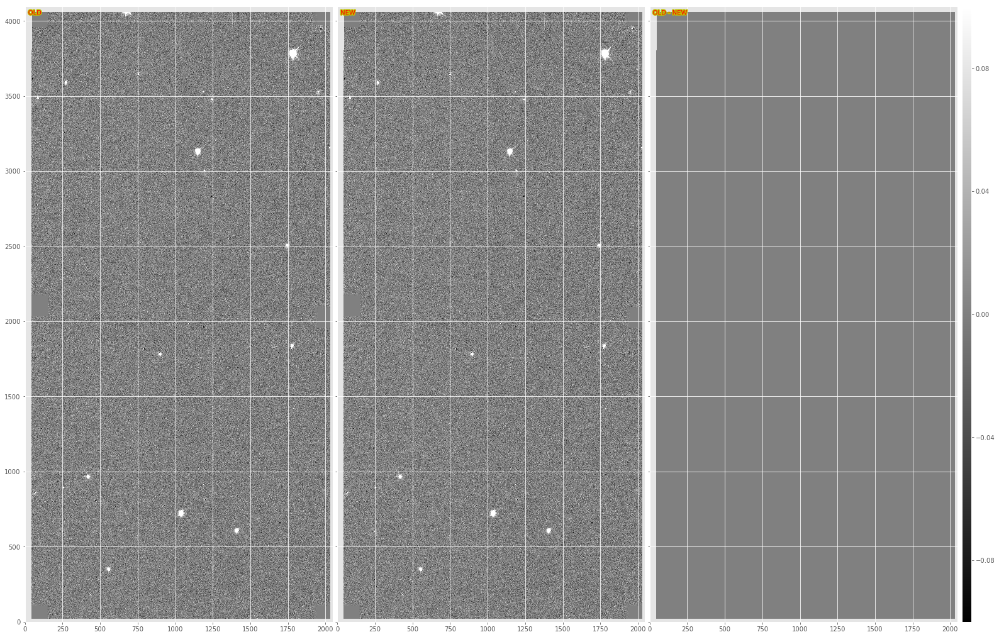

In [3]:
al_OLD = afwImage.ExposureF('decamDirTestOLD/deepDiff/v289820/diffexp-11.fits')
al_NEW = afwImage.ExposureF('decamDirTestNEW/deepDiff/v289820/diffexp-11.fits')
tmp = al_OLD.clone()
tmpImg = tmp.getMaskedImage()
tmpImg -= al_NEW.getMaskedImage()

tmpArr = tmpImg.getImage().getArray()
tmpArr = tmpArr[~np.isnan(tmpArr)]
print(np.ptp(tmpArr))

import diffimTests as dit
dit.plotImageGrid((al_OLD, al_NEW, tmp), imScale=18,
                 titles=['OLD', 'NEW', 'OLD - NEW'])

In [4]:
template = afwImage.ExposureF('calexpDir_b1631/0288976/calexp/calexp-0288976_11.fits')
science = afwImage.ExposureF('calexpDir_b1631/0289820/calexp/calexp-0289820_11.fits')
matched_template = afwImage.ExposureF('decamDirTest_AL/deepDiff/v289820/matchexp-11.fits')
al_img = afwImage.ExposureF('decamDirTest_AL/deepDiff/v289820/diffexp-11.fits')

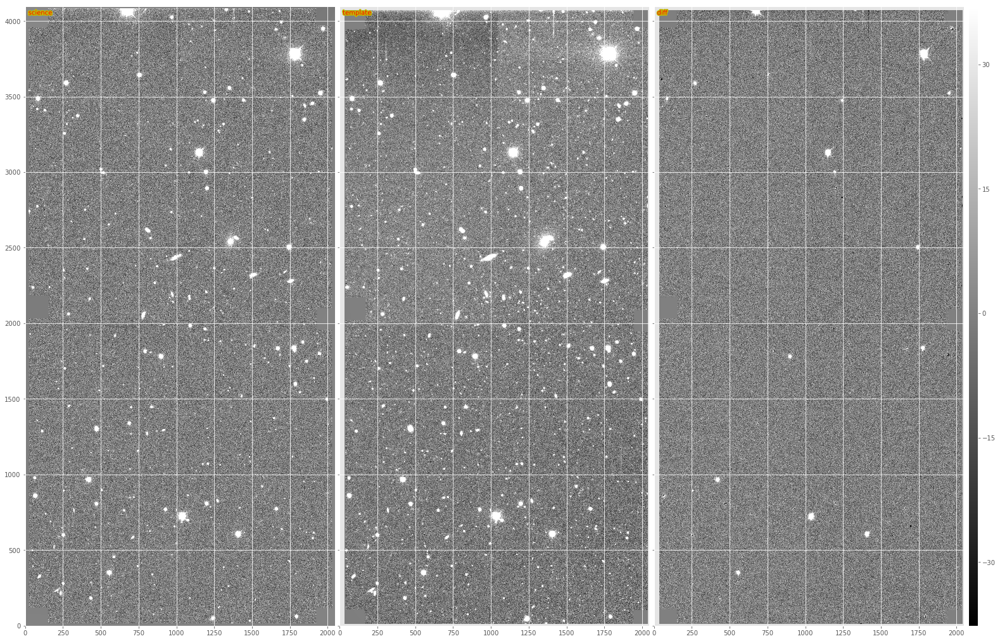

In [5]:
dit.plotImageGrid((science, matched_template, al_img,), imScale=18,
                 titles=['science', 'template', 'diff'])

In [6]:
import lsst.daf.persistence as dp
import pandas as pd

def load_dias(repo, as_df=True):
    butler = dp.Butler(repo)
    srces = butler.get('deepDiff_diaSrc',visit=289820,ccdnum=11)
    if as_df:
        srces = pd.DataFrame({col: srces.columns[col] for col in srces.schema.getNames()})
    return srces

al_dias_NEW = load_dias('decamDirTestNEW')
al_dias_OLD = load_dias('decamDirTestOLD')

Exception AttributeError: "'super' object has no attribute '__del__'" in <bound method SqliteRegistry.__del__ of <lsst.daf.persistence.registries.SqliteRegistry object at 0x83268c750>> ignored


In [7]:
# Check max-min of differences of certain columns
print(np.ptp(al_dias_NEW.base_GaussianCentroid_x - al_dias_NEW.base_GaussianCentroid_x))
print(np.ptp(al_dias_NEW.base_PsfFlux_flux - al_dias_NEW.base_PsfFlux_flux))

0.0
0.0


0.0


Exception AttributeError: "'super' object has no attribute '__del__'" in <bound method SqliteRegistry.__del__ of <lsst.daf.persistence.registries.SqliteRegistry object at 0x861f20810>> ignored


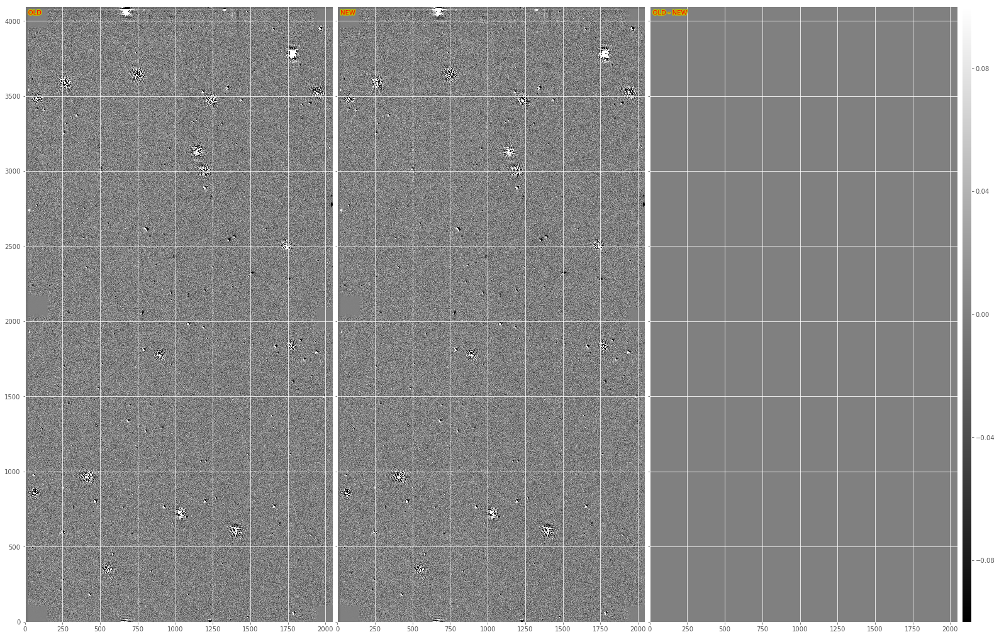

In [8]:
zogy_OLD = afwImage.ExposureF('decamDirTestOLDZogy/deepDiff/v289820/diffexp-11.fits')
zogy_NEW = afwImage.ExposureF('decamDirTestNEWZogy/deepDiff/v289820/diffexp-11.fits')
tmp = zogy_OLD.clone()
tmpImg = tmp.getMaskedImage()
tmpImg -= zogy_NEW.getMaskedImage()

tmpArr = tmpImg.getImage().getArray()
tmpArr = tmpArr[~np.isnan(tmpArr)]
print(np.ptp(tmpArr))

import diffimTests as dit
dit.plotImageGrid((zogy_OLD, zogy_NEW, tmp), imScale=18,
                 titles=['OLD', 'NEW', 'OLD - NEW'])

In [9]:
zogy_dias_NEW = load_dias('decamDirTestNEWZogy')
zogy_dias_OLD = load_dias('decamDirTestOLDZogy')
print(np.ptp(zogy_dias_NEW.base_GaussianCentroid_x - zogy_dias_NEW.base_GaussianCentroid_x))
print(np.ptp(zogy_dias_NEW.base_PsfFlux_flux - zogy_dias_NEW.base_PsfFlux_flux))

Exception AttributeError: "'super' object has no attribute '__del__'" in <bound method SqliteRegistry.__del__ of <lsst.daf.persistence.registries.SqliteRegistry object at 0x882e66790>> ignored


0.0
0.0


Compare AL-decorrelated and Zogy diaSrc catalogs...

In [10]:
al_src = load_dias('decamDirTest_ALDec_yesSpatial')
zogy_src = load_dias('decamDirTest_Zogy_yesSpatial')
print(al_src.shape, zogy_src.shape)

Exception AttributeError: "'super' object has no attribute '__del__'" in <bound method SqliteRegistry.__del__ of <lsst.daf.persistence.registries.SqliteRegistry object at 0x883170ed0>> ignored
Exception AttributeError: "'super' object has no attribute '__del__'" in <bound method SqliteRegistry.__del__ of <lsst.daf.persistence.registries.SqliteRegistry object at 0x861f20250>> ignored


((64, 183), (323, 183))


In [12]:
def ga(exposure):
    return exposure.getMaskedImage().getImage().getArray()
def gv(exposure):
    return exposure.getMaskedImage().getVariance().getArray()
def gm(exposure):
    return exposure.getMaskedImage().getMask().getArray()

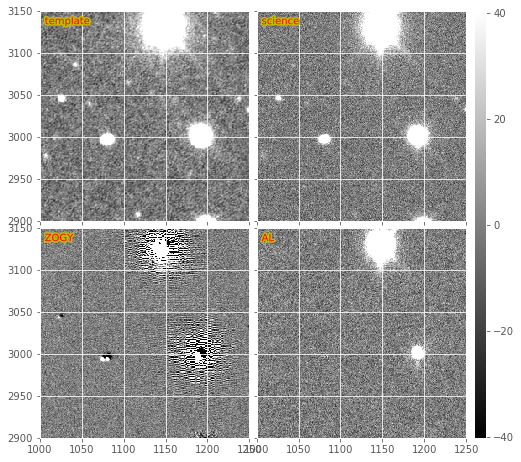

In [17]:
i1, i2 = 2900, 3150
j1, j2 = 1000, 1250
dit.plotImageGrid((ga(matched_template)[i1:i2, j1:j2], ga(science)[i1:i2, j1:j2], 
                   ga(zogy_NEW)[i1:i2, j1:j2], ga(al_img)[i1:i2, j1:j2]), imScale=4, 
                  extent=(j1, j2, i1, i2),
                 titles=['template', 'science', 'ZOGY', 'AL']) 

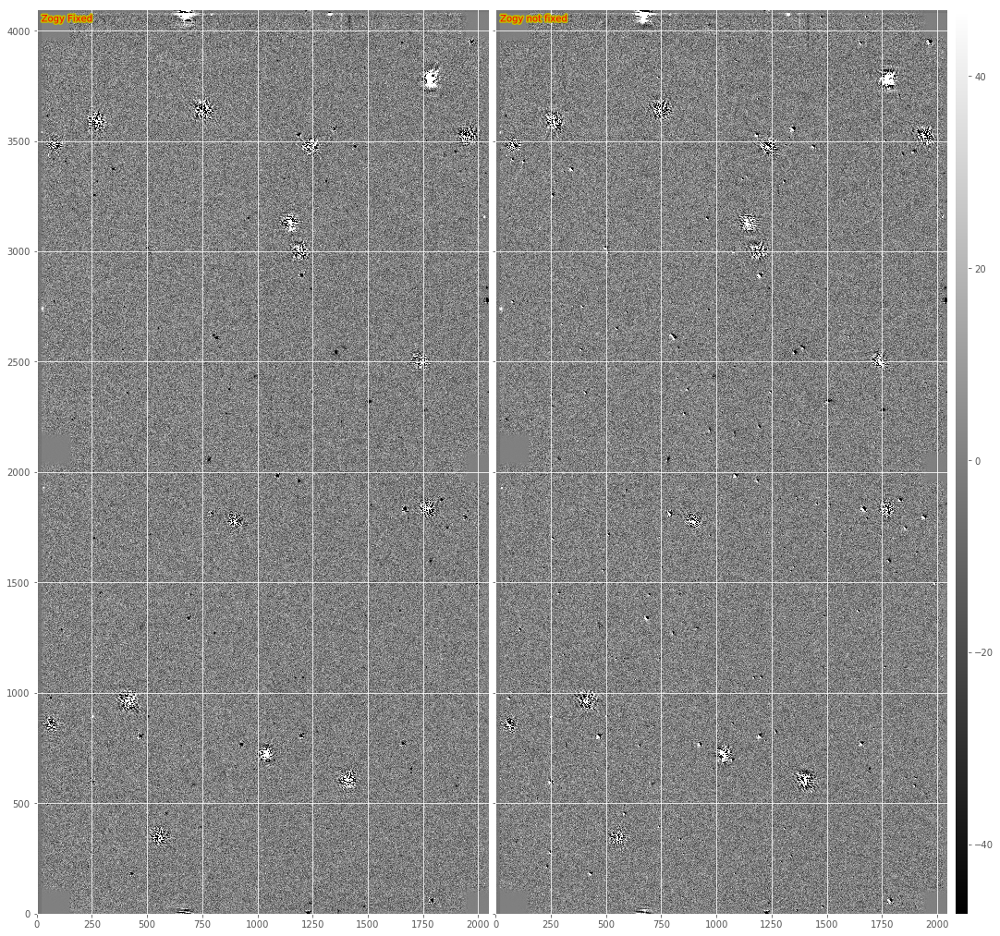

In [20]:
zogy_fixed = afwImage.ExposureF('decamDirTest_Zogy_noSpatial_doRegister/deepDiff/v289820/diffexp-11.fits')
dit.plotImageGrid((zogy_fixed, zogy_NEW), imScale=18,
                 titles=['Zogy Fixed', 'Zogy not fixed'])

Check relative flux calibration between science and template ---

197.723
0.000166802
5.3249
1.11712e-06


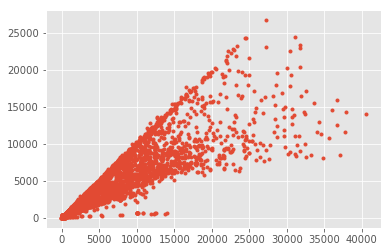

In [29]:
t = matched_template.getMaskedImage().getImage().getArray().flatten()
print(np.nanmean(t))
t -= np.nanmean(t)
print(np.nanmean(t))
s = science.getMaskedImage().getImage().getArray().flatten()
print(np.nanmean(s))
s -= np.nanmean(s)
print(np.nanmean(s))
plt.plot(s, t, '.')

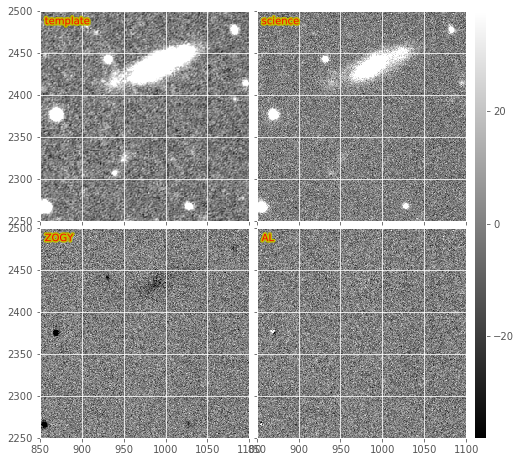

In [32]:
i1, i2 = 2250, 2500
j1, j2 = 850, 1100
dit.plotImageGrid((ga(matched_template)[i1:i2, j1:j2], ga(science)[i1:i2, j1:j2], 
                   ga(zogy_fixed)[i1:i2, j1:j2], ga(al_img)[i1:i2, j1:j2]), imScale=4, 
                  extent=(j1, j2, i1, i2),
                 titles=['template', 'science', 'ZOGY', 'AL']) 